In [1]:
import pandas as pd
%matplotlib inline

import numpy as np
import h5py
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from mpl_toolkits import mplot3d
h = 0.6776942783267969
pd.set_option("display.max_rows", None, "display.max_columns", None)

from tangos_halo_module.halo_properties import velocity_angles, track_halo_property, get_timesteps, ID_to_sim_halo_snap, infall_final_n_particles, infall_final_coordinates, apocentric_distance, disruption_time, accretion_time, orbit_interpolation, infall_velocity, quenching_time, max_sSFR_time, max_mass_time 
from tangos_halo_module.path import get_file_path, get_halo_snap_num, read_file
from tangos_halo_module.halos import ID_to_tangos_halo, get_survivors, get_main_progenitor_branch, get_zombies, get_host, get_survivor_IDs, get_zombie_IDs, blockPrint, enablePrint, tangos_to_pynbody_halo
from tangos_halo_module.new import get_sSFR_tracks

In [2]:
data = pd.read_csv('Mint_Data/Data100_new.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_form = data['time_formation'].to_numpy()

infall_vrad = abs(data['infall_radial_velocity'].to_numpy()/data['infall_relative_velocity'].to_numpy())
max_Mstar = data['max_stellarmass'].to_numpy()
log_max_Mstar = np.log10(max_Mstar)

t_quench = data['time_quench'].to_numpy()
# t_infall = np.array([accretion_time(ID=idx)[0] for idx in ids]) 
 
lookback_t_quench = 13.80-t_quench
lookback_t_disrupt = 13.80-t_disrupt
lookback_t_infall = 13.80-t_infall

phi_infall = data['infall_phi_z'].to_numpy()
phi_infall_deg = 180*phi_infall/np.pi
phi_infall_deg[phi_infall_deg>90]= 180-phi_infall_deg[phi_infall_deg>90]

phi_final = data['final_phi_z'].to_numpy()
phi_final_deg = 180*phi_final/np.pi
phi_final_deg[phi_final_deg>90]=180-phi_final_deg[phi_final_deg>90]

Delta_phi = phi_final_deg - phi_infall_deg

Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

t_final = data['time_disruption'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
lookback_t_final = 13.80-t_final
Delta_t = t_final - t_infall

In [3]:
newLabels = np.zeros(len(t_infall), dtype=int)
# # Disrupted within 1 Gyr of Infall

# Surviving & SF
newLabels[(status=='Survivor') & (t_quench<0)] = 1
# Disrupted & SF at least 1 Gyr after infall 
newLabels[(status=='Zombie') & (t_quench<0)] = 2
# Quenched within 1 Gyr of infall

# Quenched more than 1 Gyr before infall
newLabels[(t_infall-t_quench>1) & (t_quench>0)] = 4
# Quenched more than 1 Gyr after infall
newLabels[(t_infall-t_quench<1) & (t_quench>0)] = 5
newLabels[(np.abs(t_quench-t_infall)<=1) & (t_quench>0)] = 3

# Quenched within 0.5 Gyr of formation
newLabels[(t_quench-t_form<0.5) & (t_quench>0)] = 4

print(newLabels)
# data['NewLabels'] = newLabels
# data.to_csv('Mint_Data/Data100_new.csv', index=False)
ids[(newLabels==3) & (np.log10(max_Mstar)<4)]

[4 4 4 4 3 4 5 4 5 4 4 4 4 2 2 2 4 2 2 2 2 2 2 5 2 2 2 2 2 2 5 2 2 2 2 2 4
 2 2 2 2 1 1 4 4 1 1 1 3 1 4 4 4 5 5 5 4 4 4 5 5 4 5 4 4 4 3 4 3 5 4 4 4 4
 4 4 4 3 3 1 4 4 4 4 5 4 4 4 4 3 4 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2
 2 2 2 2 2 2]


array([], dtype=int64)

In [4]:
def formation_time(ID=0, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, resolution='Mint'):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        status: 'Zombie', 'Survivor': string
        tangos_halo: 0 or a valid Tangos halo object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
    output params:
        time of first encounter: the earliest time when a dwarf crosses 1.5 x the virial radius of the host
        [units: Gyr since start of simulation]
    '''
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096', resolution=resolution)
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]

    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, status=status, halo_id=halo_id, snap_num=snap_num, resolution=resolution)
    with h5py.File(path, 'r') as f:
        satMstar = f['M_star_|_Msol'][:]

    tform = min(t_Gyr[satMstar>0])
    return tform 
tform = [formation_time(ID=idx) for idx in ids]
tform
data['time_formation'] = tform
# data.to_csv('Mint_Data/Data100_new.csv', index=False)

In [5]:
from tangos_halo_module.new import unique_tracks
# add this guy to tangos_halo_module.new later
def mass_loss_fraction(ID=0, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, resolution='Mint'):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        status: 'Zombie', 'Survivor': string
        tangos_halo: 0 or a valid Tangos halo object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
    output params:
        time of first encounter: the earliest time when a dwarf crosses 1.5 x the virial radius of the host
        [units: Gyr since start of simulation]
    '''
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
        
    t, M = unique_tracks(ID=ID, key='Mvir_|_Msol', resolution=resolution)
    t = [np.round(tx, 3) for tx in t]
    t=np.array(t)
    M=np.array(M)
    print("M: ", M)
    
    t_infall = accretion_time(ID=ID, simulation=simulation, status=status, tangos_halo=tangos_halo, 
                              halo_id=halo_id, snap_num=snap_num, resolution=resolution)[0]
    print("t infall: ", t_infall)
    
#     print("infall mass: ", infall_mass)
    if t_infall<min(t):
        infall_mass = M[0]        
    else:
        infall_mass = M[t==t_infall][0]
    if infall_mass>0:
        final_fraction = M[-1]/infall_mass
    else:
        final_fraction = 0
    if status=='Zombie':
        final_fraction = 0
        
#     if len(final_fraction)==0:
#         final_fraction = M[-1]/M[0]
#     else:
#         final_fraction = final_fraction[0]
    lost_fraction = 1 - final_fraction
    print("lost fraction: ", lost_fraction)
    return lost_fraction
lostgasfrac = [mass_loss_fraction(ID=idx) for idx in ids]
lostgasfrac
data['lost_Mvir_fraction'] = lostgasfrac
data.to_csv('Mint_Data/Data100_new.csv', index=False)
print(lostgasfrac)
mass_loss_fraction(ID=14840961179)

M:  [ 4116016.8610745   6398342.09773792  8032371.43386836 10700860.42420796
 15529161.07957505 15676966.20167813 17967911.70956186 21515302.40946348
 22024454.1207704  26458743.3227183  27969662.71624789 27296102.37301889
 26154594.13060524 24856877.35703725 21719762.77323468 21046337.96886134
 20939397.81174137 21054402.53077343 21308876.73228514 20963862.57518896
 20873525.92788801 18927187.96053344 16742708.22377485 16085683.62093702
 15108380.70216194 14878439.03352566 14681297.7679604  14459556.20009187
 14434888.12836077 14336351.38029206 13991404.99262372 13293379.88594712
 13153774.8646118  12661091.12426822 12307944.63583212 12086338.60681926
 11946598.04662827 11905529.77336167 11774124.8527941  11560651.15512116
 10657284.68211154  9868651.85042265  9737246.92985508  9679778.45505297
  9589441.80775201  9499105.16045105  9408768.51315008  9285631.4627781
  9063889.89490958  9006353.65067963  8981753.34837637  8924284.87357426
  8891416.70107541  8875016.4995399   8850348.42

/home/pathakde/MAP2021/mergers/tangos_halo_module/halo_properties.py:385: RuntimeWarning: divide by zero encountered in true_divide
  distance_hostRvir = distance/hostRvir
/home/pathakde/MAP2021/mergers/tangos_halo_module/halo_properties.py:385: RuntimeWarning: invalid value encountered in true_divide
  distance_hostRvir = distance/hostRvir


t infall:  7.12
lost fraction:  0.24713412692903358
M:  [6.59585610e+07 6.56052112e+07 8.12941725e+07 1.33755164e+08
 1.42128077e+08 1.79726556e+08 2.23268413e+08 3.07231346e+08
 3.15226105e+08 3.16301606e+08 3.21471058e+08 3.29426511e+08
 3.45313698e+08 3.47139406e+08 3.86139357e+08 4.56943499e+08
 4.68336218e+08 6.92020735e+08 7.99469163e+08 8.44827241e+08
 9.72450628e+08 1.03361254e+09 1.47740741e+09 1.50196028e+09
 1.51912627e+09 1.69187054e+09 1.72120115e+09 1.64975862e+09
 1.64304267e+09 1.60644718e+09 1.59617333e+09 1.59718988e+09
 1.60408880e+09 1.61211948e+09 1.63993205e+09 1.68176612e+09
 1.71457330e+09 1.73007895e+09 1.73932270e+09 1.74447995e+09
 1.74945423e+09 1.76985282e+09 1.76487177e+09 1.76387556e+09
 1.76555624e+09 1.76247273e+09 1.76036510e+09 1.75202946e+09
 1.73238311e+09 1.69334792e+09 1.55926610e+09 1.27834827e+09
 1.07980418e+09 8.87135695e+08 8.33536855e+08 8.28637125e+08
 8.00431489e+08 7.78514856e+08]
t infall:  11.323
lost fraction:  0.5506104549953252
M:  [

M:  [8.11200051e+07 2.22140730e+08 2.35877593e+08]
t infall:  0.655
lost fraction:  1
M:  [1.45349158e+07 4.84332514e+07 1.64348317e+08 1.87629826e+08]
t infall:  0.655
lost fraction:  1
M:  [1.83358997e+06 2.31582366e+06 1.28930659e+06 3.76115581e+06
 9.76421916e+06 1.11438692e+07 1.33611493e+07 3.11210766e+08
 3.21861410e+08 4.51475862e+08 4.44485446e+08]
t infall:  1.302
lost fraction:  1
M:  [7.15103002e+07 1.15192440e+08 1.16618309e+08 1.28221791e+08
 4.21639016e+08 4.57018724e+08 4.04188388e+08 4.57913958e+08
 4.36228418e+08 3.96499269e+08]
t infall:  1.625
lost fraction:  1
M:  [4.19709620e+06 9.70763169e+06 1.54928367e+07 3.71935562e+07
 9.52953363e+07 1.02112263e+08 2.06010928e+08 3.28878934e+08
 4.32344553e+08 1.05456684e+09 1.42003381e+09 4.71219129e+09
 4.83212285e+09 3.85250899e+09 3.83576995e+09 4.03097978e+09
 4.83429147e+09 4.92649178e+09 5.88081409e+09 4.12315298e+09
 3.45921590e+09 2.03929729e+09 1.69498794e+09 1.42745457e+09
 6.47527395e+08 7.40706292e+08]
t infall: 

t infall:  6.474
lost fraction:  0.6905641376451606
M:  [2.52321844e+06 1.11225896e+07 1.35217629e+07 1.82054436e+07
 5.19580071e+07 9.15937702e+07 1.84855346e+08 2.37239758e+08
 8.41296454e+08 1.08480556e+09 1.66512873e+09 1.94913684e+09
 2.51818995e+09 2.53860888e+09 2.92088267e+09 2.97360051e+09
 3.08695165e+09 3.23475000e+09 4.18552796e+09 4.25592007e+09
 4.40396238e+09 4.35995969e+09 4.15650909e+09 3.77555681e+09
 3.83825031e+09 3.58894691e+09 1.85222656e+09 1.79734688e+09
 2.03647131e+09 2.59061514e+09 2.57206665e+09 2.44384011e+09
 2.34487642e+09 2.29097939e+09 2.27329157e+09 2.22220020e+09
 2.19524152e+09 2.17925471e+09 2.15317704e+09 2.10283113e+09
 2.05690379e+09 2.03510236e+09 1.95802142e+09 1.80277521e+09
 1.65840600e+09 1.58160968e+09 1.55032054e+09 1.52941367e+09
 1.51798097e+09 1.47546921e+09 1.46883458e+09 1.45597872e+09
 1.43342505e+09 1.42848466e+09 1.40627662e+09 1.39344109e+09]
t infall:  6.474
lost fraction:  0.6117409579630728
M:  [7.93200491e+05 5.86286874e+06 1.

M:  [1.85897640e+07 2.99539516e+07 3.45836200e+07 5.92991304e+07
 1.13732009e+08 1.43066006e+08 1.55543713e+08 1.76781974e+08
 1.88550813e+08 2.06286750e+08 2.17606955e+08 2.49913997e+08
 2.50627609e+08 2.48333614e+08 2.33038054e+08 2.54926224e+08
 2.94273153e+08 4.77247898e+08 5.18156913e+08 7.62195978e+08
 7.65753873e+08 8.05066918e+08 8.59716185e+08 8.53095111e+08
 8.57127392e+08 8.60258340e+08 8.66425358e+08 8.66452466e+08
 8.93756768e+08 9.16920359e+08 9.86445015e+08 1.02202396e+09
 1.03703489e+09 1.04174487e+09 1.04794577e+09 1.04494358e+09
 1.03593025e+09 1.04372373e+09 1.04642096e+09 1.03464263e+09
 1.03093564e+09 1.01804590e+09 9.92334178e+08 9.30169282e+08
 8.24537075e+08 7.59322554e+08 7.07607704e+08 6.85460655e+08
 6.48491076e+08 6.44918950e+08 6.34916182e+08 6.30276687e+08
 6.16028165e+08 5.98816086e+08 5.85626800e+08]
t infall:  10.767
lost fraction:  0.4319463069601115
M:  [ 4759494.35528858  7807648.01117519 11435819.86905337 12814995.49487623
 14178584.15229758 1667636

t infall:  5.868
lost fraction:  0.9025408613268328
M:  [2.83226737e+06 5.60048585e+06 7.13835714e+06 8.61335874e+06
 6.36490466e+07 1.15106373e+08 1.53671921e+08 1.73424677e+08
 2.64279082e+08 3.05220627e+08 3.39265277e+08 3.60554365e+08
 4.68127488e+08 4.79697763e+08 6.71072528e+08 7.31184688e+08
 6.90367161e+08 6.60967428e+08 4.29132959e+08 4.14723824e+08
 2.87290869e+08 2.52069065e+08 2.16240723e+08 1.96758368e+08
 1.77311931e+08 1.10516350e+08 8.90734252e+07 8.49835402e+07
 8.25363862e+07 7.48723416e+07 6.63632122e+07 4.74951192e+07
 3.46990991e+07 2.97069998e+07 2.74935147e+07 2.35266990e+07
 2.01187100e+07 1.78760164e+07 1.64229043e+07 1.49478349e+07
 1.33597939e+07 1.29392846e+07 1.23511138e+07 1.13809944e+07
 1.04267331e+07 9.75134297e+06 9.48487358e+06 9.26150555e+06
 9.09553822e+06 8.67902731e+06 8.62772586e+06 8.22761516e+06
 8.07811580e+06 6.55022016e+06 4.77207236e+06 3.58456223e+06]
t infall:  3.733
lost fraction:  0.9948077451654069
M:  [44952613.56168959 43458162.13912

t infall:  1.177
lost fraction:  1
M:  [4.36292799e+06 5.71983459e+07 1.22942552e+08 1.53814915e+08
 3.36525359e+08 4.25544568e+08 5.01874630e+08 5.82819112e+08
 1.95973598e+09 2.30401823e+09 2.59670761e+09 2.84201939e+09
 7.63571697e+09 7.88219438e+09 9.47951980e+09]
t infall:  2.625
lost fraction:  1
[0.5986015432807161, 0.733515558382582, 0.8516096440077133, 0.42262136073243894, 0.7937170816841712, 0.7732604146059577, 0.7944765626900405, 0.24713412692903358, 0.5506104549953252, 0.7551677887765558, 0.4420082553742788, 0.9200246372103097, 0.5724717648930246, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.29012791056469456, 0.35884237041307343, 0.11788258084987346, 0.10933991568095669, 0.16694159047349733, 0.2830432301326866, 0.0, 0.46847099646805757, 0.02107489731709067, 0.8584282546156117, 0.3759134796238245, 0.945988360243665, 0.6905641376451606, 0.6117409579630728, 0.09775200074836532, 0.9193118318133688, 0.8650342996830549, 0.3205595636448037

0.2541289222134965

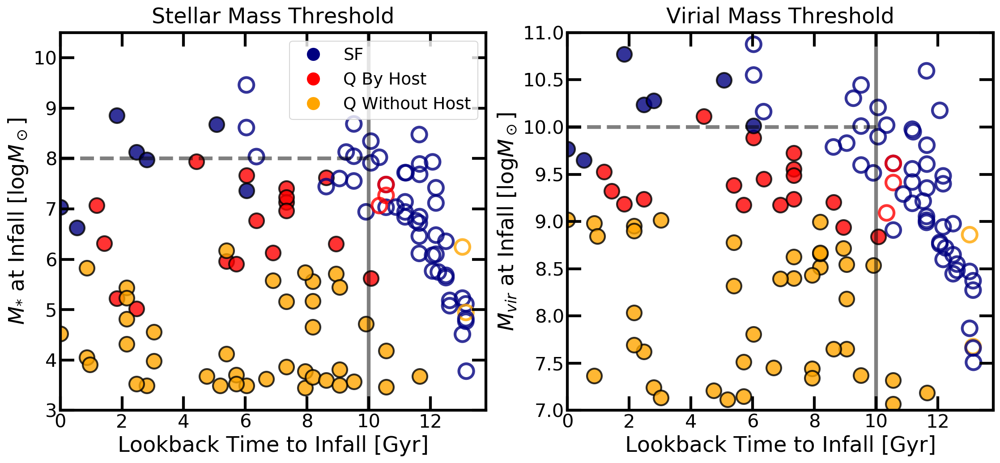

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(15, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 10, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
fig.set_dpi(150)


data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall


x = lookback_t_infall
y = M_infall

# ax1.fill_between(linx, [1e-2]*len(linx), [1e-4]*len(linx), alpha=0.3, color='lightgreen')
for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        color='none'
        ax1.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors=edgecolor, c=color, linewidth=3, alpha=0.8)
    else:
        color=edgecolor
        ax1.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors='k', c=edgecolor, linewidth=2, alpha=0.8)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='SF',
                          markerfacecolor='navy', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q By Host',
                          markerfacecolor='red', markersize=15),
#                    Line2D([0], [0], marker='o', color='w', label='Slow Q By Host',
#                           markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q Without Host',
                          markerfacecolor='orange', markersize=15)]

ax1.set_xlim(0, 13.8)
ax1.set_ylim(3, 10.5)
# ax1.set_yscale('log')
ax1.axhline(8, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
ax1.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
ax1.legend(loc='upper right', handles=legend_elements, fontsize=18, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Stellar Mass Threshold', fontsize=23, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('$M_{*}$ at Infall [$\log M_\odot$]', fontsize=23)


#----------------------------------------------------------------------------------------------

data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall

x = lookback_t_infall
y = M_infall

# ax2.fill_between(linx, [1e-2]*len(linx), [1e-4]*len(linx), alpha=0.3, color='lightgreen')
for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        color='none'
        ax2.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors=edgecolor, c=color, linewidth=3, alpha=0.8)
    else:
        color=edgecolor
        ax2.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors='k', c=edgecolor, linewidth=2, alpha=0.8)

ax2.set_xlim(0, 13.8)
ax2.set_ylim(7, 11)
# ax1.set_yscale('log')
ax2.axhline(10, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
ax2.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
# ax2.legend(loc='upper right', fontsize=15, frameon=True, framealpha=0.8)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Virial Mass Threshold', fontsize=23, pad=10)
ax2.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax2.set_ylabel('$M_{vir}$ at Infall [$\log M_\odot$]', fontsize=23)

fig.tight_layout()

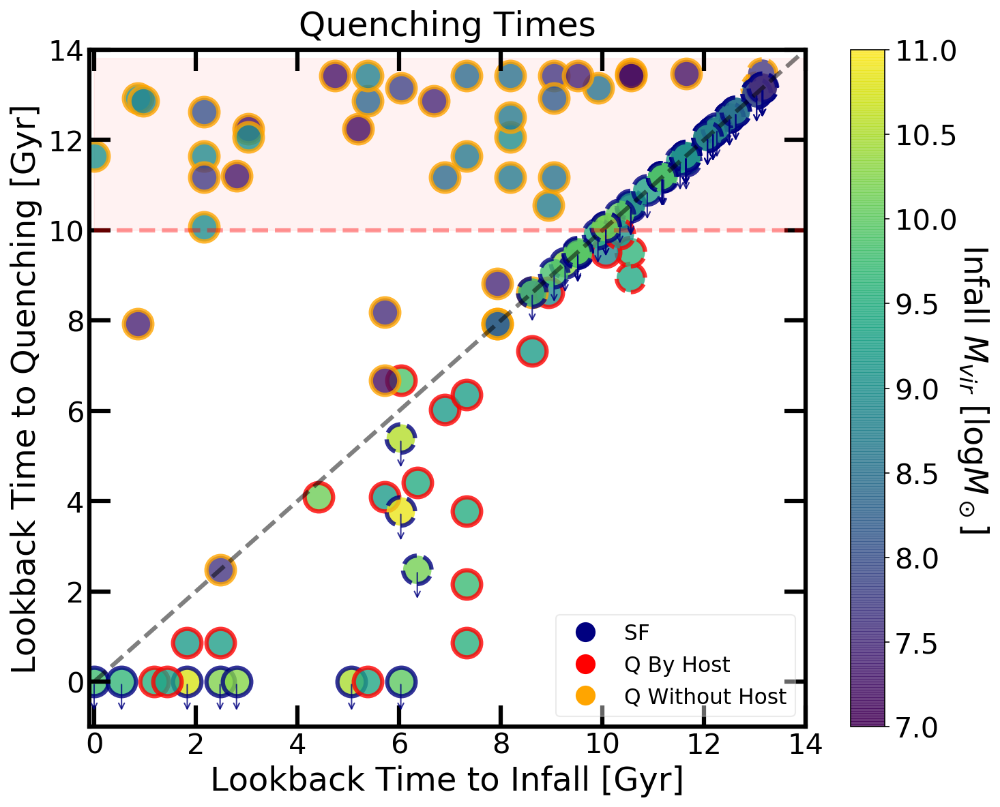

In [18]:
Mvir_infall = data['infall_virial_mass'].to_numpy()
log_Mvir_infall = np.log10(Mvir_infall)

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
plt.set_cmap(cm)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)

x=lookback_t_infall
y=lookback_t_quench
k=lookback_t_final
z=log_Mvir_infall
ax1.plot(linx, linx, lw=3, alpha=0.5, c='black', ls='--')
ax1.plot(linx, [10]*len(linx), lw=3, alpha=0.4, c='red', ls='--')
ax1.fill_between(linx, [10]*len(linx), [13.8]*len(linx), color='red', alpha=0.05)
# ax1.fill_between(linx, linx-1.5, linx+1.5, color='red', alpha=0.2)

for idx in ids[newLabels<3]:
    ax1.annotate("",
                 xy=(x[ids==idx], k[ids==idx]-0.7),
                 xytext=(x[ids==idx], k[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'navy'})

for idx in ids:
    if newLabels[ids==idx]<=2:
        edgecolor='navy'
        y=lookback_t_final
    elif newLabels[ids==idx]==3:
        edgecolor='red'
        y=lookback_t_quench
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
        y=lookback_t_quench
    elif newLabels[ids==idx]==5:
        edgecolor='red'
        y=lookback_t_quench
    
    if status[ids==idx]=='Zombie':
#         color='none'
        im1 = ax1.scatter(x[ids==idx], y[ids==idx], s=400, vmin=7, vmax=11,
                          edgecolors=edgecolor, c=z[ids==idx], linewidth=3, linestyle='--', alpha=0.8)
    else:
        ax1.scatter(x[ids==idx], y[ids==idx], s=400, vmin=7, vmax=11,
                    edgecolors=edgecolor, c=z[ids==idx], linewidth=3, alpha=0.8)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='SF',
                          markerfacecolor='navy', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q By Host',
                          markerfacecolor='red', markersize=15),
#                    Line2D([0], [0], marker='o', color='w', label='Slow Q By Host',
#                           markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q Without Host',
                          markerfacecolor='orange', markersize=15)]

# im1 = ax1.scatter(x[newLabels==1], k[newLabels==1], s=400, vmin=3, vmax=10, zorder=0.5,
#             edgecolors='navy', c=z[newLabels==1], linewidth=3, alpha=0.8, label='Surviving SF')
# ax1.scatter(x[newLabels==2], k[newLabels==2], s=400, vmin=3, vmax=10,
#             edgecolors='black', c=z[newLabels==2], linestyle='--', linewidth=3, alpha=0.8, label='Disrupted SF')
# ax1.scatter(x[newLabels==4], y[newLabels==4], s=400, vmin=3, vmax=10, 
#             edgecolors='orange', c=z[newLabels==4], linewidth=3, alpha=0.8, label='Q Without Host')
# ax1.scatter(x[newLabels==3], y[newLabels==3], s=400, vmin=3, vmax=10, 
#             edgecolors='red', c=z[newLabels==3], linewidth=3, alpha=0.8, label='Rapid Q By Host')
# ax1.scatter(x[newLabels==5], y[newLabels==5], s=400, vmin=3, vmax=10, 
#             edgecolors='yellow', c=z[newLabels==5], linewidth=3, alpha=0.8, label='Slow Q By Host')



cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('Infall $M_{vir}$ [$\log M_\odot$]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)
ax1.set_xlim(-0.1, 14)
ax1.set_ylim(-1, 14)
ax1.legend(loc='lower right', handles=legend_elements, fontsize=15, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Quenching Times', fontsize=24, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('Lookback Time to Quenching [Gyr]', fontsize=23)

fig.tight_layout()

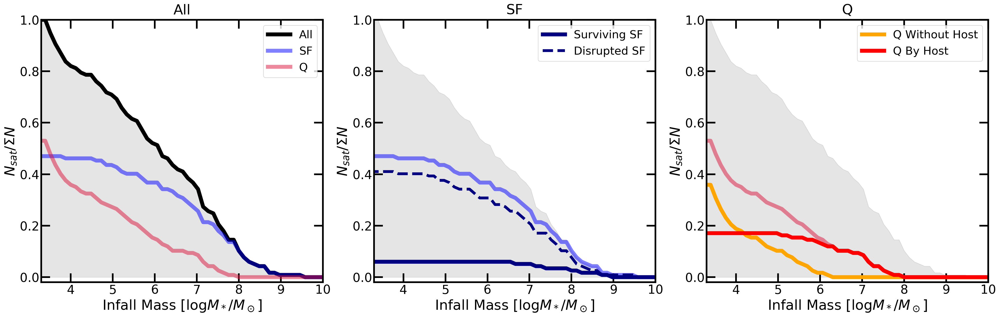

In [14]:
status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()

norm = len(status)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(25, 8))
fig.set_facecolor('w')
np.seterr(divide='ignore')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
linx=np.linspace(0, 12, 100)
# Survivors


A, B = np.histogram(M_infall, linx)
ax1.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', lw=7, label='All')
A, B = np.histogram(M_infall[newLabels<3], linx)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='blue',  lw=7, alpha=0.5, label='SF')
A, B = np.histogram(M_infall[newLabels>=3], linx)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='crimson',  lw=7, alpha=0.5, label='Q')
ax1.set_xlim(3.3, 10)
ax1.set_ylim(-0.02, 1)
ax1.legend(loc='upper right', fontsize=20, frameon=True)
ax1.tick_params(which='major', length=16, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax1.set_title('All', fontsize=25, pad=10)
ax1.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax1.set_ylabel('$N_{sat}/\Sigma N$', fontsize=25)


A, B = np.histogram(M_infall, linx)
ax2.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[newLabels<3], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='blue',  lw=7, alpha=0.5)

A, B = np.histogram(M_infall[newLabels==1], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='navy',  lw=7, label='Surviving SF')
A, B = np.histogram(M_infall[newLabels==2], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='navy',  lw=5, ls='--', label='Disrupted SF')

ax2.set_xlim(3.3, 10)
ax2.set_ylim(-0.02, 1)
ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=16, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax2.set_title('SF', fontsize=25, pad=10)
ax2.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax2.set_ylabel('$N_{sat}/\Sigma N$', fontsize=25)

A, B = np.histogram(M_infall, linx)
ax3.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[newLabels>=3], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='crimson',  lw=7, alpha=0.5)

A, B = np.histogram(M_infall[newLabels==4], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='orange',  lw=7, label='Q Without Host')
A, B = np.histogram(M_infall[(newLabels==3) | (newLabels==5)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=7, label='Q By Host')
# A, B = np.histogram(M_infall[newLabels==5], linx)
# ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=7, label='Slow Q By Host')
# A, B = np.histogram(M_infall[newLabels==3], linx)
# ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=7)

ax3.set_xlim(3.3, 10)
ax3.set_ylim(-0.02, 1)
ax3.legend(loc='upper right', fontsize=20, frameon=True)
ax3.tick_params(which='major', length=16, width=3, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax3.set_title('Q', fontsize=25, pad=10)
ax3.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax3.set_ylabel('$N_{sat}/\Sigma N$', fontsize=25)

fig.tight_layout()

Text(0, 0.5, 'sSFR [$\\log yr^{-1}$]')

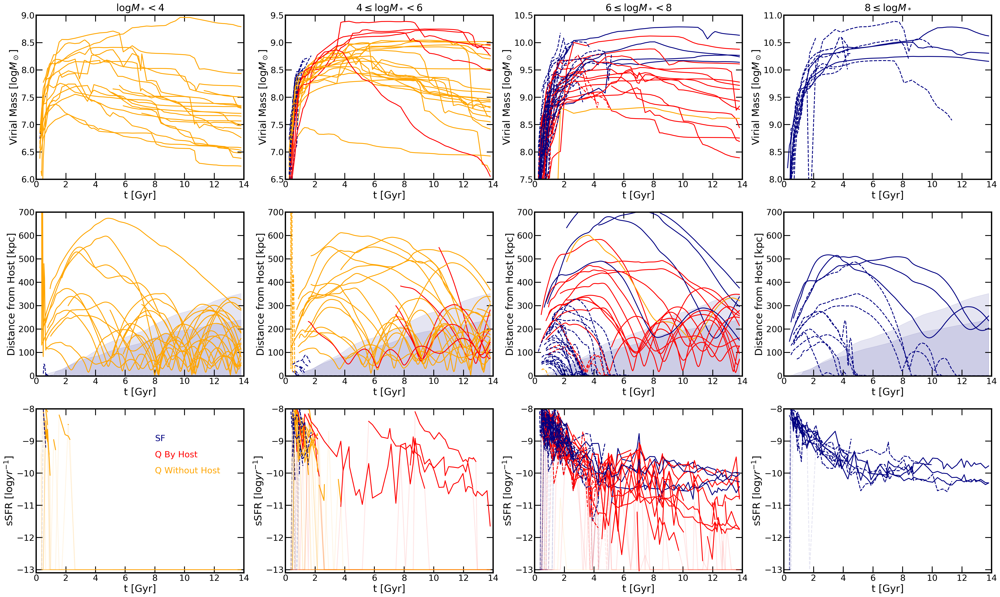

In [21]:
from tangos_halo_module.new import unique_tracks
np.seterr(divide='ignore', invalid='ignore')


fig, ((ax0, ax1, ax2, ax3), (ax8, ax4, ax5, ax6), (ax10, ax11, ax12, ax13)) = plt.subplots(3, 4, sharex='none', sharey='none', figsize=(40, 24))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

plt.setp(ax0.spines.values(), linewidth=3)
plt.setp(ax8.spines.values(), linewidth=3)

plt.setp(ax10.spines.values(), linewidth=3)
plt.setp(ax11.spines.values(), linewidth=3)
plt.setp(ax12.spines.values(), linewidth=3)
plt.setp(ax13.spines.values(), linewidth=3)


data = pd.read_csv('Mint_Data/Data100_new.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_quench = data['time_quench'].to_numpy()

for sim in ['h148', 'h329']:
    #Mint 100 ptcls
    path = get_file_path(tangos_halo=0, simulation=sim, status='Host', halo_id='1', snap_num='4096', 
                         resolution='Mint')
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostRvir = fh['Rvir_|_kpc'][:]
    ax4.fill_between(t_Gyr, hostRvir, color='navy', alpha=0.1, lw=1)
    ax5.fill_between(t_Gyr, hostRvir, color='navy', alpha=0.1, lw=1)
    ax6.fill_between(t_Gyr, hostRvir, color='navy', alpha=0.1, lw=1)
    ax8.fill_between(t_Gyr, hostRvir, color='navy', alpha=0.1, lw=1)

# -------------------------- Mint -------------------------

count=0    
for idx in ids:
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='navy'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    if status[ids==idx]=='Zombie':
        ls='--'
    else:
        ls='-'
    t, M = unique_tracks(ID=idx, key='Mvir_|_Msol', resolution='Mint')
    t=np.array(t)
    M=np.array(M)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
            count+=1
        else:
            ax2.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)

        
        
# -------------------------- Mint Radial Distance -------------------------

count=0    
for idx in ids:
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='navy'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    if status[ids==idx]=='Zombie':
        ls='--'
    else:
        ls='-'
    k, (t, x, y, z, R) = orbit_interpolation(ID=idx, resolution='Mint')
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)   
    R = (x**2 + y**2 + z**2)**(1/2)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax8.plot(t, R, lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax4.plot(t, R, lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax5.plot(t, R, lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax6.plot(t, R, lw=2, ls=ls, alpha=1, c=color)
        
        
        
# -------------------------- Mint sSFR -------------------------

count=0    
for idx in ids:
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='navy'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    if status[ids==idx]=='Zombie':
        ls='--'
    else:
        ls='-'
    t, M = get_sSFR_tracks(ID=idx)
    t=np.array(t)
    M=np.array(M)
    t=t[M>=0]
    M=M[M>=0]
    M[M==0]=1e-13

    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax10.plot(t, np.log10(M), lw=2, ls=ls, alpha=0.1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax11.plot(t, np.log10(M), lw=2, ls=ls, alpha=0.1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax12.plot(t, np.log10(M), lw=2, ls=ls, alpha=0.1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax13.plot(t, np.log10(M), lw=2, ls=ls, alpha=0.1, c=color)

        
    t, M = get_sSFR_tracks(ID=idx)
    t=np.array(t)
    M=np.array(M)
    t=t[M>=0]
    M=M[M>=0]
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax10.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax11.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax12.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax13.plot(t, np.log10(M), lw=2, ls=ls, alpha=1, c=color)
        


# ----------------------------------------------------------------------------------

ax0.set_xlim(0, 14)
ax0.set_ylim(6, 9)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax0.tick_params(which='major', length=15, width=2, labelsize=15)
ax0.tick_params(which='minor', length=8, width=2, labelsize=15)
ax0.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('$\log M_* < 4$', fontsize=23, pad=10)
ax0.set_xlabel('t [Gyr]', fontsize=23)
ax0.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax1.set_xlim(0, 14)
ax1.set_ylim(6.5, 9.5)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$4 \leq \log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(7.5, 10.5)
# ax1.set_xscale('log')
# ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(8, 11)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(-1, 700)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(-1, 700)
# ax5.legend(loc='upper right', fontsize=20, frameon=True)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(-1, 700)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax8.set_xlim(0, 14)
ax8.set_ylim(-1, 700)
ax8.tick_params(which='major', length=15, width=2, labelsize=15)
ax8.tick_params(which='minor', length=8, width=2, labelsize=15)
ax8.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_xlabel('t [Gyr]', fontsize=23)
ax8.set_ylabel('Distance from Host [kpc]', fontsize=23)

#---------------------------------------------------------------------

ax10.set_xlim(0, 14)
ax10.set_ylim(-13.1, -8)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax10.tick_params(which='major', length=15, width=2, labelsize=15)
ax10.tick_params(which='minor', length=8, width=2, labelsize=15)
ax10.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax10.set_title('$\log M_* < 4$', fontsize=23, pad=10)
ax10.set_xlabel('t [Gyr]', fontsize=23)
ax10.set_ylabel('sSFR [$\log yr^{-1}$]', fontsize=23)
ax10.text(8, -9, 'SF', color='navy', fontsize=20)
ax10.text(8, -9.5, 'Q By Host', color='red', fontsize=20)
ax10.text(8, -10, 'Q Without Host', color='orange', fontsize=20)

ax11.set_xlim(0, 14)
ax11.set_ylim(-13.1, -8)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax11.tick_params(which='major', length=15, width=2, labelsize=15)
ax11.tick_params(which='minor', length=8, width=2, labelsize=15)
ax11.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax11.set_title('$4 \leq \log M_* < 6$', fontsize=23, pad=10)
ax11.set_xlabel('t [Gyr]', fontsize=23)
ax11.set_ylabel('sSFR [$\log yr^{-1}$]', fontsize=23)

ax12.set_xlim(0, 14)
ax12.set_ylim(-13.1, -8)
# ax1.set_xscale('log')
# ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax12.tick_params(which='major', length=15, width=2, labelsize=15)
ax12.tick_params(which='minor', length=8, width=2, labelsize=15)
ax12.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax12.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax12.set_xlabel('t [Gyr]', fontsize=23)
ax12.set_ylabel('sSFR [$\log yr^{-1}$]', fontsize=23)

ax13.set_xlim(0, 14)
ax13.set_ylim(-13.1, -8)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax13.tick_params(which='major', length=15, width=2, labelsize=15)
ax13.tick_params(which='minor', length=8, width=2, labelsize=15)
ax13.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax13.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax13.set_xlabel('t [Gyr]', fontsize=23)
ax13.set_ylabel('sSFR [$\log yr^{-1}$]', fontsize=23)


In [4]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

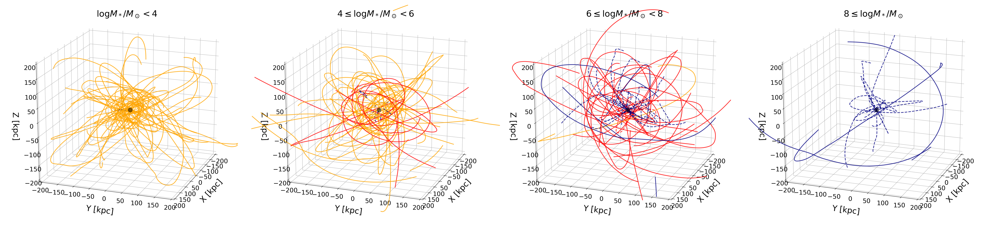

In [5]:
# %matplotlib notebook
data = pd.read_csv('Mint_Data/Data100_new.csv')
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
plt.rcParams.update({'figure.max_open_warning': 0})
t_infall = data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
status = data['Status'].to_numpy()
sim = data['Simulation'].to_numpy()
# plt.figure(figsize=, facecolor='w')
# fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(23, 15))
fig = plt.figure(figsize=(40, 18))
fig.set_dpi(150)
fig.set_facecolor('w')
# plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)
# plt.setp(ax3.spines.values(), linewidth=3)

# plt.setp(ax4.spines.values(), linewidth=3)
# plt.setp(ax5.spines.values(), linewidth=3)
# plt.setp(ax6.spines.values(), linewidth=3)
ax0 = fig.add_subplot(241, projection='3d')
ax1 = fig.add_subplot(242, projection='3d')
ax2 = fig.add_subplot(243, projection='3d')
ax3 = fig.add_subplot(244, projection='3d')

      
for idx in ids:
    t_in=t_infall[ids==idx]
    t_q=t_quench[ids==idx]
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='navy'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    if status[ids==idx]=='Zombie':
        ls='--'
    else:
        ls='-'
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution='Mint')
    R=np.sqrt(x**2 + y**2 + z**2)
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot3D(np.array(x)[(t>=t_in-1) & (R<400)], np.array(y)[(t>=t_in-1) & (R<400)], 
                   np.array(z)[(t>=t_in-1) & (R<400)], c=color, alpha=0.8, lw=2, ls=ls)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot3D(np.array(x)[(t>=t_in-1) & (R<400)], np.array(y)[(t>=t_in-1) & (R<400)], 
                   np.array(z)[(t>=t_in-1) & (R<400)], c=color, alpha=0.8, lw=2, ls=ls)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax2.plot3D(np.array(x)[(t>=t_in-1) & (R<400)], np.array(y)[(t>=t_in-1) & (R<400)], 
                   np.array(z)[(t>=t_in-1) & (R<400)], c=color, alpha=0.8, lw=2, ls=ls)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot3D(np.array(x)[(t>=t_in-1) & (R<400)], np.array(y)[(t>=t_in-1) & (R<400)], 
                   np.array(z)[(t>=t_in-1) & (R<400)], c=color, alpha=0.8, lw=2, ls=ls)

# ax0.text(0, 0, -50, 'Host CoM', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='black')
ax0.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('$\log M_*/M_\odot < 4$', fontsize=25, pad=10)
ax0.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax0.set_xlim(-200, 200)
ax0.set_ylim(-200, 200)
ax0.set_zlim(-200, 200)
ax0.tick_params(which='both', length=10, labelsize=18)
ax0.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax0.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax0.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax0.azim=20
ax0.elev=20

# ax1.text(100, 100, 100, 'Quenched', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='red')
# # ax1.text(100, 100, 150, 'h229', horizontalalignment='center', verticalalignment='center',
# #          fontsize=27, color='blue')
# # ax1.text(100, 100, 100, 'h242', horizontalalignment='center', verticalalignment='center',
# #          fontsize=27, color='green')
# ax1.text(100, 100, 150, 'Star-Forming', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='navy')
ax1.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$4 \leq \log M_*/M_\odot < 6$', fontsize=25, pad=10)
ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax1.set_xlim(-200, 200)
ax1.set_ylim(-200, 200)
ax1.set_zlim(-200, 200)
ax1.tick_params(which='both', length=10, labelsize=18)
ax1.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax1.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax1.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax1.set_xticks([])
ax1.azim=20
ax1.elev=20

ax2.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_*/M_\odot < 8$', fontsize=25, pad=10)
ax2.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax2.set_xlim(-200, 200)
ax2.set_ylim(-200, 200)
ax2.set_zlim(-200, 200)
ax2.tick_params(which='both', length=10, labelsize=18)
ax2.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax2.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax2.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax2.azim=20
ax2.elev=20

ax3.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*/M_\odot$', fontsize=25, pad=10)
ax3.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax3.set_xlim(-200, 200)
ax3.set_ylim(-200, 200)
ax3.set_zlim(-200, 200)
ax3.tick_params(which='both', length=10, labelsize=18)
ax3.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax3.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax3.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax3.set_xticks([])
ax3.azim=20
ax3.elev=20

fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace=0)
# fig.tight_layout()

In [15]:
def max_mass_time(ID=0, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, category='stars', resolution=1000):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        status: 'Zombie', 'Survivor': string
        tangos_halo: 0 or a valid Tangos halo object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
        category: 'stars' or 'dm' or 'total': string
    output params:
        maximum stellar mass: the maximum stellar mass of a dwarf before disruption
            [units: Msol]
        time of maximum stellar mass: the earliest time before disruption when a dwarf reaches its maximum stellar mass
            [units: Gyr since start of simulation]
    '''
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096', resolution=resolution)
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostMstar = fh['M_star_|_Msol'][:]
        hostMvir = fh['Mvir_|_Msol'][:]
        hostMgas = fh['M_gas_|_Msol'][:]
    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, status=status, halo_id=halo_id, snap_num=snap_num, resolution=resolution)
    with h5py.File(path, 'r') as f:
        satMstar = f['M_star_|_Msol'][:]
        satMvir = f['Mvir_|_Msol'][:]
        satMgas = f['M_gas_|_Msol'][:]
    total_mass=satMstar+satMvir+satMgas    
    
    if category=='stars':
        max_satM = max(satMstar[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[satMstar==max_satM])
    elif category=='dm':
        max_satM = max(satMvir[satMvir != hostMvir])
        max_satM_time = min(t_Gyr[satMvir==max_satM])
    elif category=='total':
        max_satM = max(total_mass[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[total_mass==max_satM])
    elif category=='ratio':
        ratio = satMstar/total_mass
        ratio[total_mass==0]=0
        max_satM = max(ratio[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[ratio==max_satM])
    else:
        raise ValueError('A very specific bad thing happened. Try category= "stars" or "dm".') 
    
    return max_satM, max_satM_time

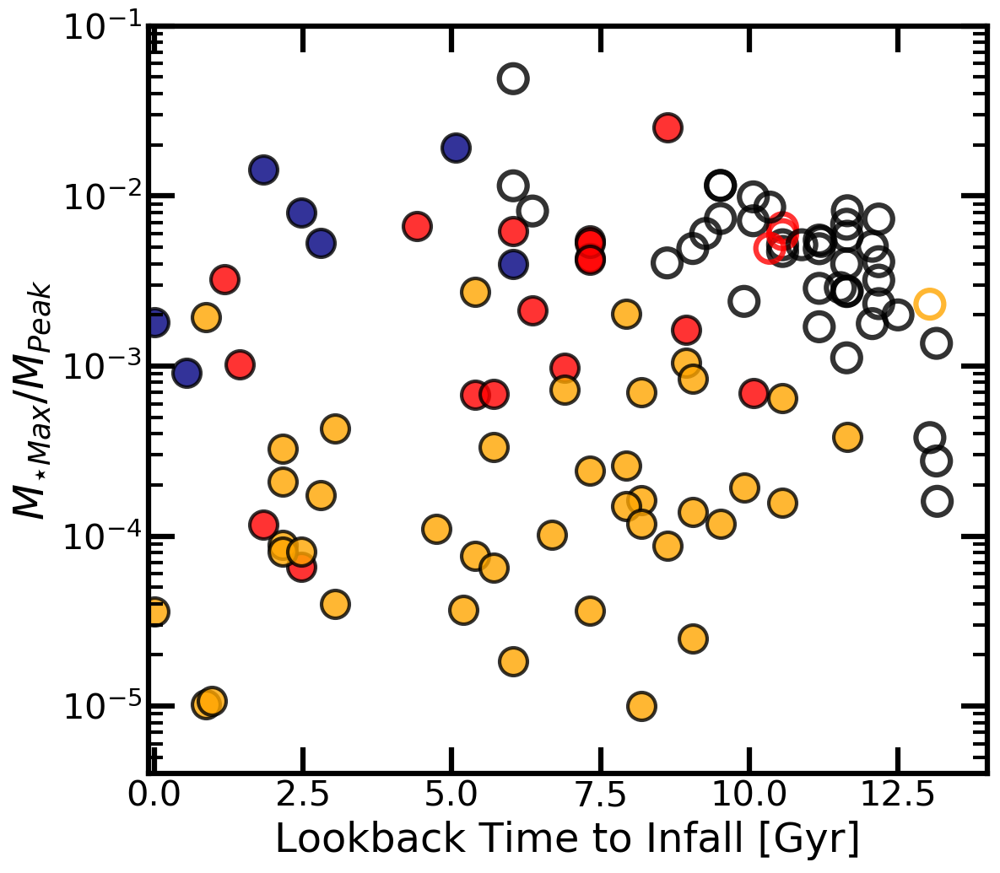

In [16]:
#Ferah's figure
# from tangos_halo_module.halo_properties import max_mass_time
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)

Mpeak=np.array([max_mass_time(ID=idx, category='total', resolution='Mint')[0] for idx in ids])
x = lookback_t_infall
y = (max_Mstar/Mpeak)

for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='black'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        color='none'
        ax1.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors=edgecolor, c=color, linewidth=3, alpha=0.8)
    else:
        color=edgecolor
        ax1.scatter(x[ids==idx], y[ids==idx], s=250, 
                    edgecolors='k', c=edgecolor, linewidth=2, alpha=0.8)


# # the scatter plot:
# ax1.scatter(x[newLabels==1], y[newLabels==1], s=150, 
#             color='navy', edgecolors="black", linewidth=1, alpha=0.8, label='Surviving SF')
# ax1.scatter(x[newLabels==2], y[newLabels==2], s=150, 
#             color='none', edgecolors="black", linewidth=2, alpha=0.8, label='Disrupted SF')
# ax1.scatter(x[newLabels==4], y[newLabels==4], s=150, 
#             color='orange', edgecolors="black", linewidth=1, alpha=0.8, label='Q Without Host')
# ax1.scatter(x[newLabels==3], y[newLabels==3], s=150, 
#             color='red', edgecolors="black", linewidth=1, alpha=0.8, label='Rapid Q By Host')
# ax1.scatter(x[newLabels==5], y[newLabels==5], s=150, 
#             color='red', edgecolors="black", linewidth=1, alpha=0.8, label='Slow Q By Host')

# ax1.text(9.7, 4e-5, 'Quenched', horizontalalignment='left', verticalalignment='center',
#          fontsize=20, color='red')
# ax1.text(9.7, 2e-5, 'Star-Forming', horizontalalignment='left', verticalalignment='center',
#          fontsize=20, color='navy')
ax1.set_xlim(-0.1, 14)
ax1.set_ylim(4e-6 , 1e-1)
ax1.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=13, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Quenching Times', fontsize=24, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('$M_{\star Max}/M_{Peak}$', fontsize=24)

fig.tight_layout()

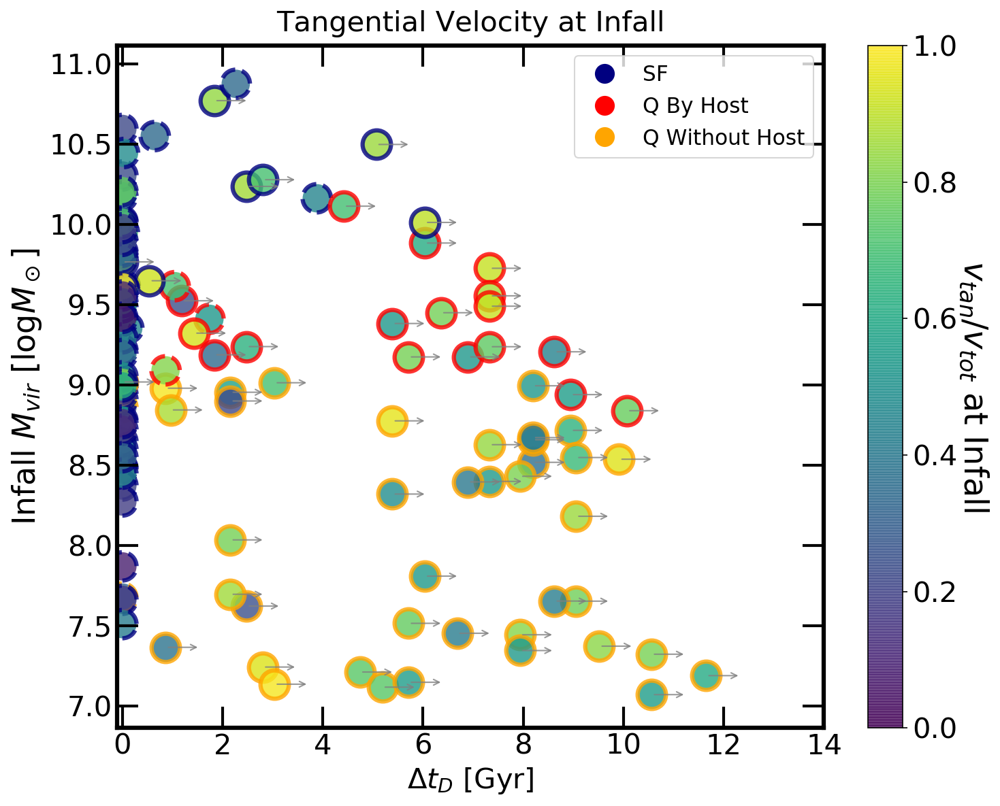

In [11]:
vtan = data['infall_tangential_velocity'].to_numpy()
vtot = data['infall_relative_velocity'].to_numpy()
M_infall = data['infall_virial_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
status = data['Status'].to_numpy()

t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
plt.set_cmap(cm)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=Delta_t
y= np.log10(M_infall)#data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=vtan/vtot
k=t_infall
for idx in ids[status=='Survivor']:
    ax1.annotate("",
                 xy=(x[ids==idx]+0.7, y[ids==idx]),
                 xytext=(x[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'grey'})
for idx in ids:
    if newLabels[ids==idx]<=2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
#         color='none'
        im1 = ax1.scatter(x[ids==idx], y[ids==idx], s=400, vmin=0, vmax=1,
                          edgecolors=edgecolor, c=z[ids==idx], linewidth=3, linestyle='--', alpha=0.8)
    else:
        ax1.scatter(x[ids==idx], y[ids==idx], s=400, vmin=0, vmax=1,
                    edgecolors=edgecolor, c=z[ids==idx], linewidth=3, alpha=0.8)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='SF',
                          markerfacecolor='navy', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q By Host',
                          markerfacecolor='red', markersize=15),
#                    Line2D([0], [0], marker='o', color='w', label='Slow Q By Host',
#                           markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q Without Host',
                          markerfacecolor='orange', markersize=15)]
# im1 = ax1.scatter(x[newLabels==1], y[newLabels==1], s=400, vmin=0, vmax=1,
#             edgecolors='navy', c=z[newLabels==1], linewidth=2, alpha=0.8, label='Surviving SF')
# ax1.scatter(x[newLabels==2], y[newLabels==2], s=400, vmin=0, vmax=1,
#             edgecolors='black', c=z[newLabels==2], linewidth=1, alpha=0.8, label='Disrupted SF')
# ax1.scatter(x[newLabels==4], y[newLabels==4], s=400, vmin=0, vmax=1,
#             edgecolors='orange', c=z[newLabels==4], linewidth=2, alpha=0.8, label='Q Without Host')
# ax1.scatter(x[newLabels==3], y[newLabels==3], s=400, vmin=0, vmax=1,
#             edgecolors='red', c=z[newLabels==3], linewidth=2, alpha=0.8, label='Rapid Q By Host')
# ax1.scatter(x[newLabels==5], y[newLabels==5], s=400, vmin=0, vmax=1,
#             edgecolors='yellow', c=z[newLabels==5], linewidth=2, alpha=0.8, label='Slow Q By Host')
# ax1.plot(linx, linx, lw=0.7, c='black', ls='--')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('${v_{tan}/v_{tot}}$ at Infall', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_xlim(-0.1, 14)
# ax1.set_ylim(1e-8 , 1e0)
# ax1.set_yscale('log')
ax1.legend(loc='upper right', handles=legend_elements, fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Tangential Velocity at Infall', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta t_{D}$ [Gyr]', fontsize=20)
ax1.set_ylabel('Infall $M_{vir}$ [$\log M_\odot$]', fontsize=22)
fig.tight_layout()

In [39]:
ids[M_infall<6]

array([14840961179])

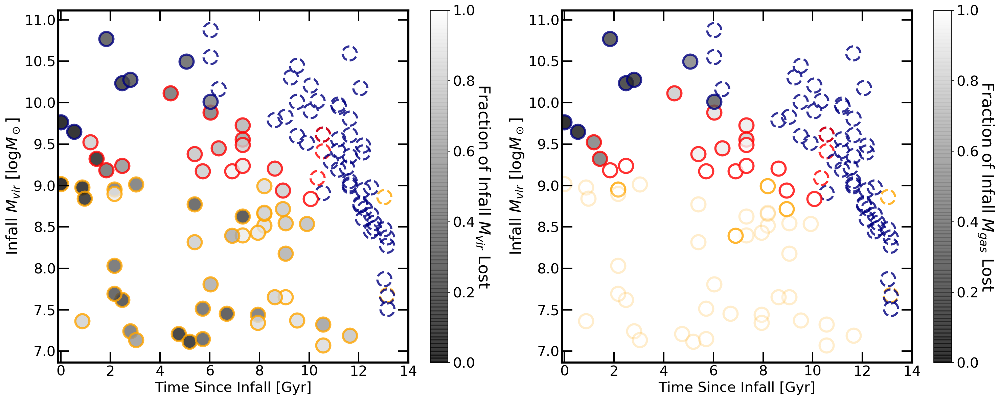

In [13]:
data = pd.read_csv('Mint_Data/Data100_new.csv')

vtan = data['infall_tangential_velocity'].to_numpy()
vtot = data['infall_relative_velocity'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
status = data['Status'].to_numpy()
lostfrac = data['lost_Mvir_fraction'].to_numpy()
lostgasfrac = data['lost_gas_fraction'].to_numpy()
n_gas = data['infall_n_gas'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall

fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(20, 8))
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('binary').reversed()
plt.set_cmap(cm)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
x = lookback_t_infall #x=Delta_t
y= M_infall#data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=lostfrac
k=lostgasfrac
# for idx in ids[status=='Survivor']:
#     ax1.annotate("",
#                  xy=(x[ids==idx]+0.7, y[ids==idx]),
#                  xytext=(x[ids==idx], y[ids==idx]),
#                  va='center', ha='right', 
#                  arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'grey'})
#     if n_gas[ids==idx]>0:
#         ax2.annotate("",
#                      xy=(x[ids==idx]+0.7, y[ids==idx]),
#                      xytext=(x[ids==idx], y[ids==idx]),
#                      va='center', ha='right', 
#                      arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'grey'})
#     else:
#         ax2.annotate("",
#                      xy=(x[ids==idx]+0.7, y[ids==idx]),
#                      xytext=(x[ids==idx], y[ids==idx]),
#                      va='center', ha='right', 
#                      arrowprops={'alpha': 0.1, 'arrowstyle': '->', 'color':'grey'})
for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        color1='none'
        color2='none'
        linestyle='--'
    else:
        color1=z[ids==idx]
        color2=k[ids==idx]
        linestyle='-',
    im1 = ax1.scatter(x[ids==idx], y[ids==idx], s=400, vmin=0, vmax=1, linestyle=linestyle,
                      edgecolors=edgecolor, c=color1, linewidth=3, alpha=0.8)
    
    if n_gas[ids==idx]>0:
        im2 = ax2.scatter(x[ids==idx], y[ids==idx], s=400, vmin=0, vmax=1, linestyle=linestyle,
                          edgecolors=edgecolor, c=color2, linewidth=3, alpha=0.8)
    else:
        im2 = ax2.scatter(x[ids==idx], y[ids==idx], s=400, vmin=0, vmax=1, linestyle=linestyle,
                          edgecolors=edgecolor, c=color2, linewidth=3, alpha=0.2)
        


cbar1 = fig.colorbar(im1, ax=ax1, cmap=cm)
cbar1.set_label('Fraction of Infall $M_{vir}$ Lost', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

cbar2 = fig.colorbar(im2, ax=ax2, cmap=cm)
cbar2.set_label('Fraction of Infall $M_{gas}$ Lost', rotation=270, fontsize=23, labelpad=23)
cbar2.ax.tick_params(labelsize=20)

ax1.set_xlim(-0.1, 14)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Tangential Velocity at Infall', fontsize=20, pad=10)
ax1.set_xlabel('Time Since Infall [Gyr]', fontsize=20)
ax1.set_ylabel('Infall $M_{vir}$ [$\log M_\odot$]', fontsize=22)

ax2.set_xlim(-0.1, 14)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Tangential Velocity at Infall', fontsize=20, pad=10)
ax2.set_xlabel('Time Since Infall [Gyr]', fontsize=20)
ax2.set_ylabel('Infall $M_{vir}$ [$\log M_\odot$]', fontsize=22)

fig.tight_layout()

# Infall virial mass better determines how much gas is lost
# Infall stellar mass better determines how much virial mass is lost

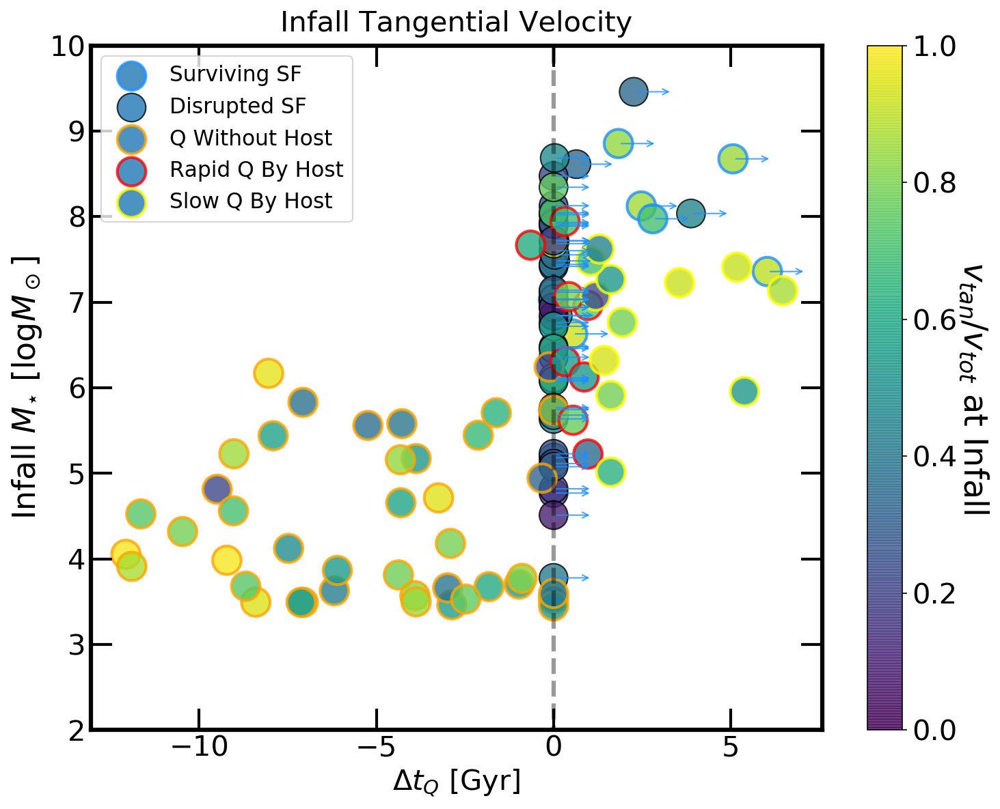

In [29]:
vtan = data['infall_tangential_velocity']
vtot = data['infall_relative_velocity']
M_infall = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
t_quench = data['time_quench'].to_numpy()
status = data['Status'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_quench - t_infall

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
plt.set_cmap(cm)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=Delta_t
y= np.log10(M_infall)#data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=vtan/vtot
k=t_final - t_infall
for idx in ids[newLabels<3]:
    ax1.annotate("",
                 xy=(k[ids==idx]+1.1, y[ids==idx]),
                 xytext=(k[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'navy'})

ax1.plot([0]*len(linx), linx, lw=3, alpha=0.4, c='k', ls='--')
im1 = ax1.scatter(k[newLabels==1], y[newLabels==1], s=400, vmin=0, vmax=1,
            edgecolors='navy', c=z[newLabels==1], linewidth=2, alpha=0.8, label='Surviving SF')
ax1.scatter(k[newLabels==2], y[newLabels==2], s=400, vmin=0, vmax=1,
            edgecolors='black', c=z[newLabels==2], linewidth=1, alpha=0.8, label='Disrupted SF')
ax1.scatter(x[newLabels==4], y[newLabels==4], s=400, vmin=0, vmax=1,
            edgecolors='orange', c=z[newLabels==4], linewidth=2, alpha=0.8, label='Q Without Host')
ax1.scatter(x[newLabels==3], y[newLabels==3], s=400, vmin=0, vmax=1,
            edgecolors='red', c=z[newLabels==3], linewidth=2, alpha=0.8, label='Rapid Q By Host')
ax1.scatter(x[newLabels==5], y[newLabels==5], s=400, vmin=0, vmax=1,
            edgecolors='yellow', c=z[newLabels==5], linewidth=2, alpha=0.8, label='Slow Q By Host')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('${v_{tan}/v_{tot}}$ at Infall', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

# ax1.set_xlim(-13, 7)
ax1.set_ylim(2, 10)
# ax1.set_yscale('log')
ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Infall Tangential Velocity', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta t_Q$ [Gyr]', fontsize=20)
ax1.set_ylabel('Infall $M_{\star}$ [$\log M_\odot$]', fontsize=22)
fig.tight_layout()

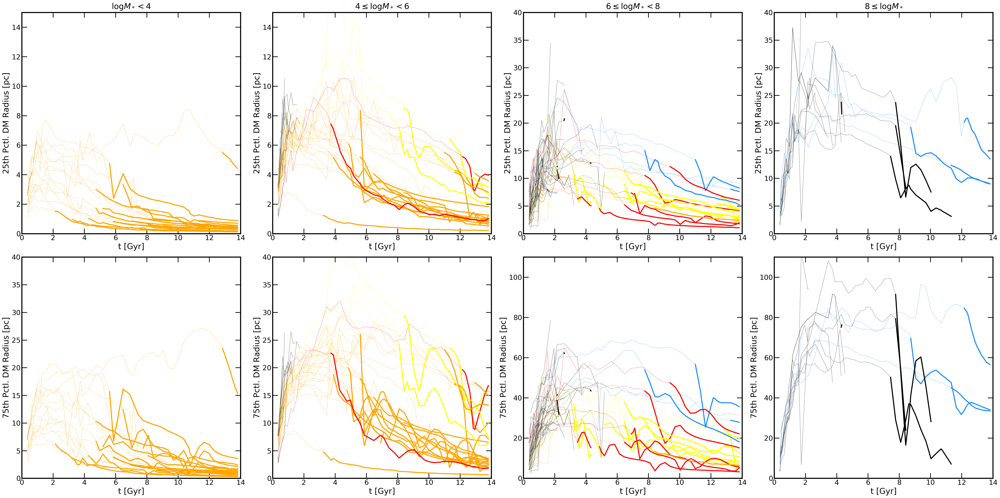

In [30]:
from tangos_halo_module.new import get_mass_profiles

fig, ((ax0, ax1, ax2, ax3), (ax8, ax4, ax5, ax6)) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(40, 20))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

plt.setp(ax0.spines.values(), linewidth=3)
plt.setp(ax8.spines.values(), linewidth=3)


data = pd.read_csv('Mint_Data/Data100_new.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_quench = data['time_quench'].to_numpy()


# -------------------------- Mint 25th & 75th Pctl R-------------------------

count=0    
for idx in ids:
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='black'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    pctl25=profile[:,0]*50000
    pctl75=profile[:,2]*50000
    
    t=np.array([float(round(tx, 3)) for tx in t])
#     pctl25_in=pctl25/pctl25[t==np.round(t_in, 3)]
#     pctl75_in=pctl75/pctl75[t==np.round(t_in, 3)]
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot(t[pctl25>0], pctl25[pctl25>0], lw=1, alpha=0.4, c=color)
        ax8.plot(t[pctl75>0], pctl75[pctl75>0], lw=1, alpha=0.4, c=color)
        ax0.plot(t[(pctl25>0)&(t>=t_in)], pctl25[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax8.plot(t[(pctl75>0)&(t>=t_in)], pctl75[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t[pctl25>0], pctl25[pctl25>0], lw=1, alpha=0.4, c=color)
        ax4.plot(t[pctl75>0], pctl75[pctl75>0], lw=1, alpha=0.4, c=color)
        ax1.plot(t[(pctl25>0)&(t>=t_in)], pctl25[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax4.plot(t[(pctl75>0)&(t>=t_in)], pctl75[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax2.plot(t[pctl25>0], pctl25[pctl25>0], lw=1, alpha=0.4, c=color)
        ax5.plot(t[pctl75>0], pctl75[pctl75>0], lw=1, alpha=0.4, c=color)
        ax2.plot(t[(pctl25>0)&(t>=t_in)], pctl25[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax5.plot(t[(pctl75>0)&(t>=t_in)], pctl75[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t[pctl25>0], pctl25[pctl25>0], lw=1, alpha=0.4, c=color)
        ax6.plot(t[pctl75>0], pctl75[pctl75>0], lw=1, alpha=0.4, c=color)
        ax3.plot(t[(pctl25>0)&(t>=t_in)], pctl25[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax6.plot(t[(pctl75>0)&(t>=t_in)], pctl75[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)

        


ax0.set_xlim(0, 14)
ax0.set_ylim(0, 15)
# ax0.set_yscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax0.tick_params(which='major', length=15, width=2, labelsize=15)
ax0.tick_params(which='minor', length=8, width=2, labelsize=15)
ax0.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('$\log M_* < 4$', fontsize=23, pad=10)
ax0.set_xlabel('t [Gyr]', fontsize=23)
ax0.set_ylabel('25th Pctl. DM Radius [pc]', fontsize=23)

ax1.set_xlim(0, 14)
ax1.set_ylim(0, 15)
# ax1.set_yscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$4 \leq \log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('25th Pctl. DM Radius [pc]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(0, 40)
# ax1.set_xscale('log')
# ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('25th Pctl. DM Radius [pc]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(0, 40)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('25th Pctl. DM Radius [pc]', fontsize=23)

ax8.set_xlim(0, 14)
ax8.set_ylim(0, 40)
ax8.tick_params(which='major', length=15, width=2, labelsize=15)
ax8.tick_params(which='minor', length=8, width=2, labelsize=15)
ax8.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_xlabel('t [Gyr]', fontsize=23)
ax8.set_ylabel('75th Pctl. DM Radius [pc]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(0, 40)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('75th Pctl. DM Radius [pc]', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(0, 110)
# ax5.legend(loc='upper right', fontsize=20, frameon=True)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('75th Pctl. DM Radius [pc]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(0, 110)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('75th Pctl. DM Radius [pc]', fontsize=23)


# For massive galaxies that disrupt:
# 25 pctl R starts to fall even before infall (become nuggets) and disrupt Very quickly after infall
# But 75 pctl doesn't fall before infall
# Does 25 pctl fall because of triggered starburst or stripping/shape changing?
# Don't see a HUGE spike in sSFR after around infall tho :(
fig.tight_layout()

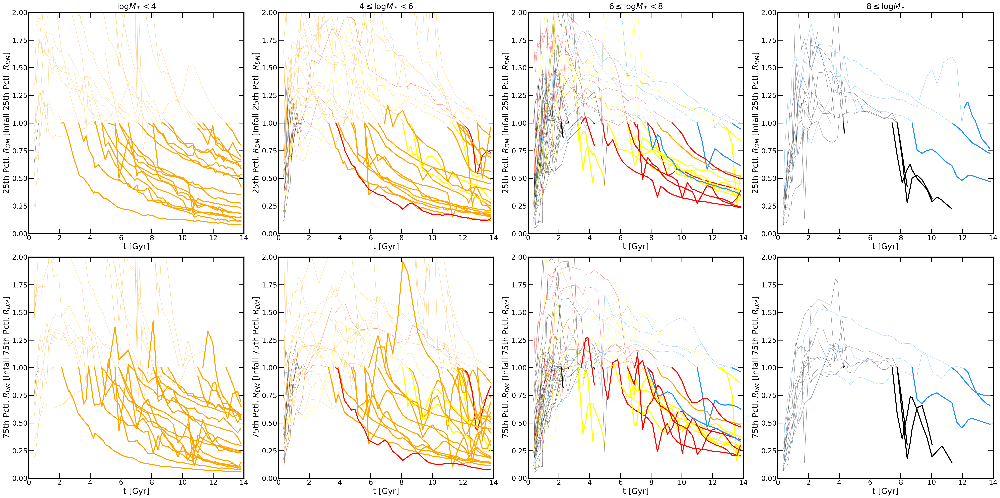

In [31]:
from tangos_halo_module.new import get_mass_profiles

fig, ((ax0, ax1, ax2, ax3), (ax8, ax4, ax5, ax6)) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(40, 20))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

plt.setp(ax0.spines.values(), linewidth=3)
plt.setp(ax8.spines.values(), linewidth=3)


data = pd.read_csv('Mint_Data/Data100_new.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_quench = data['time_quench'].to_numpy()


# -------------------------- Mint 25th & 75th Pctl R-------------------------

count=0    
for idx in ids:
    if newLabels[ids==idx]==1:
        color='navy'
    elif newLabels[ids==idx]==2:
        color='black'
    elif newLabels[ids==idx]==3:
        color='red'
    elif newLabels[ids==idx]==4:
        color='orange'
    elif newLabels[ids==idx]==5:
        color='red'
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    pctl25=profile[:,0]*50000
    pctl75=profile[:,2]*50000
    
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25_in=pctl25/pctl25[t==np.round(t_in, 3)]
    pctl75_in=pctl75/pctl75[t==np.round(t_in, 3)]
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot(t[pctl25>0], pctl25_in[pctl25>0], lw=1, alpha=0.4, c=color)
        ax8.plot(t[pctl75>0], pctl75_in[pctl75>0], lw=1, alpha=0.4, c=color)
        ax0.plot(t[(pctl25>0)&(t>=t_in)], pctl25_in[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax8.plot(t[(pctl75>0)&(t>=t_in)], pctl75_in[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t[pctl25>0], pctl25_in[pctl25>0], lw=1, alpha=0.4, c=color)
        ax4.plot(t[pctl75>0], pctl75_in[pctl75>0], lw=1, alpha=0.4, c=color)
        ax1.plot(t[(pctl25>0)&(t>=t_in)], pctl25_in[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax4.plot(t[(pctl75>0)&(t>=t_in)], pctl75_in[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax2.plot(t[pctl25>0], pctl25_in[pctl25>0], lw=1, alpha=0.4, c=color)
        ax5.plot(t[pctl75>0], pctl75_in[pctl75>0], lw=1, alpha=0.4, c=color)
        ax2.plot(t[(pctl25>0)&(t>=t_in)], pctl25_in[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax5.plot(t[(pctl75>0)&(t>=t_in)], pctl75_in[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t[pctl25>0], pctl25_in[pctl25>0], lw=1, alpha=0.4, c=color)
        ax6.plot(t[pctl75>0], pctl75_in[pctl75>0], lw=1, alpha=0.4, c=color)
        ax3.plot(t[(pctl25>0)&(t>=t_in)], pctl25_in[(pctl25>0)&(t>=t_in)], lw=3, alpha=1, c=color)
        ax6.plot(t[(pctl75>0)&(t>=t_in)], pctl75_in[(pctl75>0)&(t>=t_in)], lw=3, alpha=1, c=color)

        


ax0.set_xlim(0, 14)
ax0.set_ylim(0, 2)
# ax0.set_yscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax0.tick_params(which='major', length=15, width=2, labelsize=15)
ax0.tick_params(which='minor', length=8, width=2, labelsize=15)
ax0.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('$\log M_* < 4$', fontsize=23, pad=10)
ax0.set_xlabel('t [Gyr]', fontsize=23)
ax0.set_ylabel('25th Pctl. $R_{DM}$ [Infall 25th Pctl. $R_{DM}$]', fontsize=23)

ax1.set_xlim(0, 14)
ax1.set_ylim(0, 2)
# ax1.set_yscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$4 \leq \log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('25th Pctl. $R_{DM}$ [Infall 25th Pctl. $R_{DM}$]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(0, 2)
# ax1.set_xscale('log')
# ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('25th Pctl. $R_{DM}$ [Infall 25th Pctl. $R_{DM}$]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(0, 2)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('25th Pctl. $R_{DM}$ [Infall 25th Pctl. $R_{DM}$]', fontsize=23)

ax8.set_xlim(0, 14)
ax8.set_ylim(0, 2)
ax8.tick_params(which='major', length=15, width=2, labelsize=15)
ax8.tick_params(which='minor', length=8, width=2, labelsize=15)
ax8.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_xlabel('t [Gyr]', fontsize=23)
ax8.set_ylabel('75th Pctl. $R_{DM}$ [Infall 75th Pctl. $R_{DM}$]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(0, 2)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('75th Pctl. $R_{DM}$ [Infall 75th Pctl. $R_{DM}$]', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(0, 2)
# ax5.legend(loc='upper right', fontsize=20, frameon=True)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('75th Pctl. $R_{DM}$ [Infall 75th Pctl. $R_{DM}$]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(0, 2)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('75th Pctl. $R_{DM}$ [Infall 75th Pctl. $R_{DM}$]', fontsize=23)


# For massive galaxies that disrupt:
# 25 pctl R starts to fall even before infall (become nuggets) and disrupt Very quickly after infall
# But 75 pctl doesn't fall before infall
# Does 25 pctl fall because of triggered starburst or stripping/shape changing?
# Don't see a HUGE spike in sSFR after around infall tho :(
fig.tight_layout()

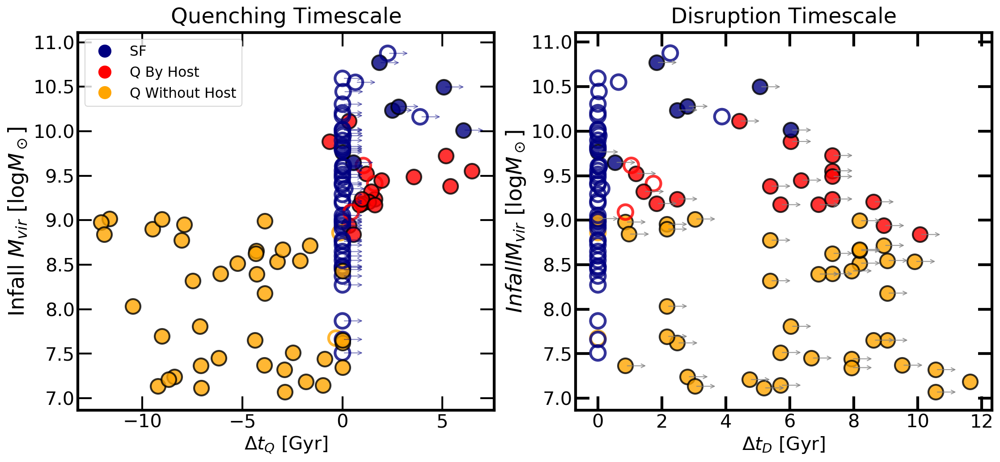

In [14]:
# Updated Ferah Figure !!!
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(15, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 10, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
fig.set_dpi(150)


data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall
impact_param = data['distance_closest_approach_hostRvir'].to_numpy()
Delta_t = t_quench - t_infall



x=Delta_t
y= M_infall #(max_Mstar/Mpeak)
z=vtan
k=t_final - t_infall

for idx in ids[newLabels<3]:
    ax1.annotate("",
                 xy=(k[ids==idx]+1.1, y[ids==idx]),
                 xytext=(k[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.5, 'arrowstyle': '->', 'color':'navy'})
for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
        a=k
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
        a=k
    elif newLabels[ids==idx]==3:
        edgecolor='red'
        a=x
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
        a=x
    elif newLabels[ids==idx]==5:
        edgecolor='red'
        a=x
        
    if status[ids==idx]=='Zombie':
        color='none'
        ax1.scatter(a[ids==idx], y[ids==idx], s=250, 
                    edgecolors=edgecolor, c=color, linewidth=3, alpha=0.8)
    else:
        color=edgecolor
        ax1.scatter(a[ids==idx], y[ids==idx], s=250, 
                    edgecolors='k', c=edgecolor, linewidth=2, alpha=0.8)
        
legend_elements = [Line2D([0], [0], marker='o', color='w', label='SF',
                          markerfacecolor='navy', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q By Host',
                          markerfacecolor='red', markersize=15),
#                    Line2D([0], [0], marker='o', color='w', label='Slow Q By Host',
#                           markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q Without Host',
                          markerfacecolor='orange', markersize=15)]

# ax1.set_ylim(0, 2.5)
# ax1.set_yscale('log')
# ax1.set_ylim(2e-6 , 1e-1)
# # ax1.axhline(8, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
# ax1.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
ax1.legend(loc='upper left', handles=legend_elements, fontsize=15, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_xlabel('$\Delta t_Q$ [Gyr]', fontsize=20)
ax1.set_ylabel('Infall $M_{vir}$ $[\log M_\odot]$', fontsize=23)
ax1.set_title('Quenching Timescale', fontsize=23, pad=10)
fig.tight_layout()


#----------------------------------------------------------------------------------------------

data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall

Delta_t = t_final - t_infall

x=Delta_t
y= M_infall #(max_Mstar/Mpeak)
z=vtan
k=t_final - t_infall

for idx in ids[status=='Survivor']:
    ax2.annotate("",
                 xy=(k[ids==idx]+0.7, y[ids==idx]),
                 xytext=(k[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'grey'})
for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        color='none'
        ax2.scatter(k[ids==idx], y[ids==idx], s=250, 
                    edgecolors=edgecolor, c=color, linewidth=3, alpha=0.8)
    else:
        color=edgecolor
        ax2.scatter(k[ids==idx], y[ids==idx], s=250, 
                    edgecolors='k', c=edgecolor, linewidth=2, alpha=0.8)


# ax2.set_yscale('log')
# ax2.set_ylim(2e-6 , 1e-1)
# ax2.set_ylim(0, 2.5)
# ax2.legend(loc='upper right', fontsize=15, frameon=True, framealpha=0.8)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Disruption Timescale', fontsize=23, pad=10)
ax2.set_xlabel('$\Delta t_{D}$ [Gyr]', fontsize=20)
ax2.set_ylabel('$Infall M_{vir}$ $[\log M_\odot]$', fontsize=23)

fig.tight_layout()
# tQ correlated with Mpeak ratio, but tDisrupt isn't !!!!

In [26]:



pctl_in=[]
for idx in ids:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    pctl25=profile[:,0]*50000
    pctl50=profile[:,1]*50000
# Better to normalize over pctl 50 because pctl 100 (Rvir) is too prone to sudden change when so close to the host
    
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25_in=pctl25[t==np.round(t_in, 3)][0]
    pctl50_in=pctl50[t==np.round(t_in, 3)][0]
    pctl_in.append(pctl25_in/pctl50_in)
pctl_in=np.array(pctl_in)
pctl_in

NameError: name 'get_mass_profiles' is not defined

TypeError: only integer scalar arrays can be converted to a scalar index

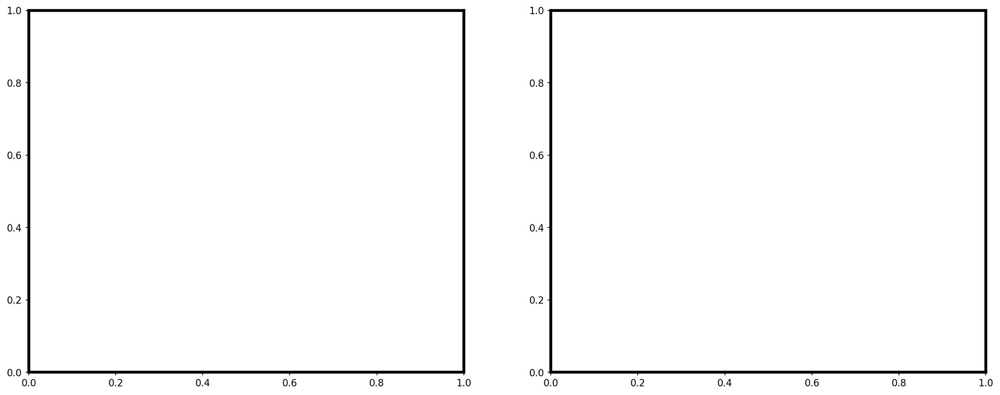

In [27]:
# No Luck Here T.T
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(18, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 10, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
fig.set_dpi(150)


data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall
impact_param = data['distance_closest_approach_hostRvir'].to_numpy()
Delta_t = t_quench - t_infall


Mpeak=np.array([max_mass_time(ID=idx, category='total', resolution='Mint')[0] for idx in ids])

x=Delta_t
y= pctl_in
z=vtan
k=t_final - t_infall

for idx in ids[newLabels<3]:
    ax1.annotate("",
                 xy=(k[ids==idx]+1.1, y[ids==idx]),
                 xytext=(k[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'navy'})
ax1.scatter(k[newLabels==1], y[newLabels==1], s=150, 
            color='navy', edgecolors="black", linewidth=1, alpha=0.8, label='Surviving SF')
ax1.scatter(k[newLabels==2], y[newLabels==2], s=150, 
            color='none', edgecolors="black", linewidth=2, alpha=0.8, label='Disrupted SF')
ax1.scatter(x[newLabels==4], y[newLabels==4], s=150, 
            color='orange', edgecolors="black", linewidth=1, alpha=0.8, label='Q Without Host')
ax1.scatter(x[newLabels==3], y[newLabels==3], s=150, 
            color='red', edgecolors="black", linewidth=1, alpha=0.8, label='Rapid Q By Host')
ax1.scatter(x[newLabels==5], y[newLabels==5], s=150, 
            color='red', edgecolors="black", linewidth=1, alpha=0.8, label='Slow Q By Host')

# ax1.set_ylim(0, 2.5)
# ax1.set_yscale('log')
# ax1.set_ylim(2e-6 , 1e-1)
# ax1.axhline(8, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
# ax1.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
ax1.legend(loc=(-0.65,0.5), fontsize=16, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_xlabel('$\Delta t_Q$ [Gyr]', fontsize=20)
ax1.set_ylabel('Infall 25th Pctl./75th Pctl', fontsize=23)
ax1.set_title('Quenching Timescale', fontsize=23, pad=10)
fig.tight_layout()


#----------------------------------------------------------------------------------------------

data = pd.read_csv('Mint_Data/Data100_new.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall

Delta_t = t_final - t_infall

x=Delta_t
y= pctl_in
z=vtan
k=t_final - t_infall

for idx in ids[status=='Survivor']:
    ax2.annotate("",
                 xy=(k[ids==idx]+0.7, y[ids==idx]),
                 xytext=(k[ids==idx], y[ids==idx]),
                 va='center', ha='right', 
                 arrowprops={'alpha': 0.8, 'arrowstyle': '->', 'color':'grey'})
ax2.scatter(k[newLabels==1], y[newLabels==1], s=150, 
            color='navy', edgecolors="black", linewidth=1, alpha=0.8)
ax2.scatter(k[newLabels==2], y[newLabels==2], s=150, 
            color='none', edgecolors="black", linewidth=2, alpha=0.8)
ax2.scatter(k[newLabels==3], y[newLabels==3], s=150, 
            color='red', edgecolors="black", linewidth=1, alpha=0.8)
ax2.scatter(k[newLabels==4], y[newLabels==4], s=150, 
            color='orange', edgecolors="black", linewidth=1, alpha=0.8)
ax2.scatter(k[newLabels==5], y[newLabels==5], s=150, 
            color='red', edgecolors="black", linewidth=1, alpha=0.8)

# ax2.set_yscale('log')
# ax2.set_ylim(2e-6 , 1e-1)
# ax2.set_ylim(0, 2.5)
# ax2.legend(loc='upper right', fontsize=15, frameon=True, framealpha=0.8)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Disruption Timescale', fontsize=23, pad=10)
ax2.set_xlabel('$\Delta t_{D}$ [Gyr]', fontsize=20)
ax2.set_ylabel('Infall 25th Pctl./75th Pctl', fontsize=23)

fig.tight_layout()
# tQ correlated with Mpeak ratio, but tDisrupt isn't

In [4]:
from scipy.optimize import curve_fit
def funclin(t, m, b):
    return m*t+b


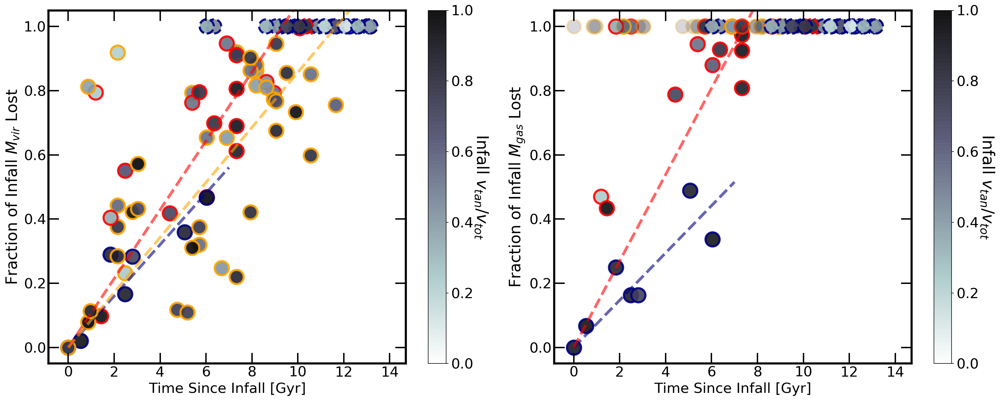

In [7]:
data = pd.read_csv('Mint_Data/Data100_new.csv')

vtan = data['infall_tangential_velocity'].to_numpy()
vtot = data['infall_relative_velocity'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
status = data['Status'].to_numpy()
lostfrac = data['lost_Mvir_fraction'].to_numpy()
lostgasfrac = data['lost_gas_fraction'].to_numpy()
n_gas = data['infall_n_gas'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall

fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(20, 8))
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('bone').reversed()
plt.set_cmap(cm)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
x = lookback_t_infall #x=Delta_t
y= vtan/vtot#data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=lostfrac
k=lostgasfrac

vmin=0
vmax=1
# lm Fits
x_dummy = np.linspace(0, 14, 14)
xSF_dummy = np.linspace(0, 7, 14)
p0 = np.array([0, 0])
popt1, pcov1 = curve_fit(funclin, x[newLabels==1], z[newLabels==1], bounds=((0, 0), (100, 0.00000001)))
ax1.plot(xSF_dummy, funclin(xSF_dummy, *popt1), color='navy', lw=4, alpha=0.6, ls='--')
redx = np.concatenate((x[(newLabels==3)&(status=='Survivor')], x[(newLabels==5)&(status=='Survivor')]), axis=0)
redz = np.concatenate((z[(newLabels==3)&(status=='Survivor')], z[(newLabels==5)&(status=='Survivor')]), axis=0)
popt1, pcov1 = curve_fit(funclin, redx, redz, bounds=((0, 0), (100, 0.00000001)))
ax1.plot(x_dummy, funclin(x_dummy, *popt1), color='red', lw=4, alpha=0.6, ls='--')
popt1, pcov1 = curve_fit(funclin, x[(newLabels==4)&(status=='Survivor')], z[(newLabels==4)&(status=='Survivor')], bounds=((0, 0), (100, 0.00000001)))
ax1.plot(x_dummy, funclin(x_dummy, *popt1), color='orange', lw=4, alpha=0.6, ls='--')

popt2, pcov2 = curve_fit(funclin, x[newLabels==1], k[newLabels==1], bounds=((0, 0), (100, 0.00000001)))
ax2.plot(xSF_dummy, funclin(xSF_dummy, *popt2), color='navy', lw=4, alpha=0.6, ls='--')
redx = np.concatenate((x[(newLabels==3)&(status=='Survivor')&(n_gas>0)], x[(newLabels==5)&(status=='Survivor')&(n_gas>0)]), axis=0)
redk = np.concatenate((k[(newLabels==3)&(status=='Survivor')&(n_gas>0)], k[(newLabels==5)&(status=='Survivor')&(n_gas>0)]), axis=0)
popt2, pcov2 = curve_fit(funclin, redx, redk, bounds=((0, 0), (100, 0.00000001)))
ax2.plot(x_dummy, funclin(x_dummy, *popt2), color='red', lw=4, alpha=0.6, ls='--')
                      

for idx in ids:
    if newLabels[ids==idx]==1:
        edgecolor='navy'
    elif newLabels[ids==idx]==2:
        edgecolor='navy'
    elif newLabels[ids==idx]==3:
        edgecolor='red'
    elif newLabels[ids==idx]==4:
        edgecolor='orange'
    elif newLabels[ids==idx]==5:
        edgecolor='red'
    
    if status[ids==idx]=='Zombie':
        linestyle='--'
    else:
        linestyle='-'
    color1=y[ids==idx]
    color2=y[ids==idx]
    im1 = ax1.scatter(x[ids==idx], z[ids==idx], s=400, vmin=vmin, vmax=vmax, linestyle=linestyle,
                      edgecolors=edgecolor, c=color1, linewidth=3, alpha=0.9)
    
    if n_gas[ids==idx]>0:
        im2 = ax2.scatter(x[ids==idx], k[ids==idx], s=400, vmin=vmin, vmax=vmax, linestyle=linestyle,
                          edgecolors=edgecolor, c=color2, linewidth=3, alpha=0.9)
    else:
        im2 = ax2.scatter(x[ids==idx], k[ids==idx], s=400, vmin=vmin, vmax=vmax, linestyle=linestyle,
                          edgecolors=edgecolor, c=color2, linewidth=3, alpha=0.2)
        


cbar1 = fig.colorbar(im1, ax=ax1, cmap=cm)
cbar1.set_label('Infall $v_{tan}/v_{tot}$', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

cbar2 = fig.colorbar(im2, ax=ax2, cmap=cm)
cbar2.set_label('Infall $v_{tan}/v_{tot}$', rotation=270, fontsize=23, labelpad=23)
cbar2.ax.tick_params(labelsize=20)

# ax1.set_xlim(-0.1, 14)
ax1.set_ylim(-0.05, 1.05)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Tangential Velocity at Infall', fontsize=20, pad=10)
ax1.set_xlabel('Time Since Infall [Gyr]', fontsize=20)
ax1.set_ylabel('Fraction of Infall $M_{vir}$ Lost', fontsize=22)

# ax2.set_xlim(-0.1, 14)
ax2.set_ylim(-0.05, 1.05)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Tangential Velocity at Infall', fontsize=20, pad=10)
ax2.set_xlabel('Time Since Infall [Gyr]', fontsize=20)
ax2.set_ylabel('Fraction of Infall $M_{gas}$ Lost', fontsize=22)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='SF',
                          markerfacecolor='navy', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q By Host',
                          markerfacecolor='red', markersize=15),
#                    Line2D([0], [0], marker='o', color='w', label='Slow Q By Host',
#                           markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Q Without Host',
                          markerfacecolor='orange', markersize=15)]

fig.tight_layout()

# Infall virial mass better determines how much gas is lost
# Infall stellar mass better determines how much virial mass is lost
# mass vs mvir mgas lost has no relation
# t infall vs massssss lost has trend!!

# Things with more radial orbits lose mass faster
# Things with more circular orbits lie on a straight line
# Things with almost equal vtan and vrad proportions show scatter
# No one can hold gas more than 8 Gyr
# No one can hold dm more than 12 Gyr

array([ 0.        ,  1.07692308,  2.15384615,  3.23076923,  4.30769231,
        5.38461538,  6.46153846,  7.53846154,  8.61538462,  9.69230769,
       10.76923077, 11.84615385, 12.92307692, 14.        ])